# Extract PNG

In this notebook, the generated GeoTIFF file is converted into a PNG image, for easy visualization.
Only 3 channels (roads, buildings, railways) are considered, as RGB channels, respectively.
For the sake of visualization, some post-processing is applied.

In [1]:
import rasterio

import numpy as np
import scipy.ndimage

from PIL import Image

In [2]:
# Selected channels
descriptions = [
    "road",
    "building",
    "railway",
]

In [3]:
# Load GeoTIFF
# Note: index is 1-based
with rasterio.open("../data/switzerland.tif", "r") as src:
    description_map = {d: i for i, d in enumerate(src.descriptions, 1)}
    indexes = [description_map[d] for d in descriptions]
    array = src.read(indexes)

In [4]:
# Permute axes, to have HxWxD
array = np.transpose(array, [1, 2, 0])

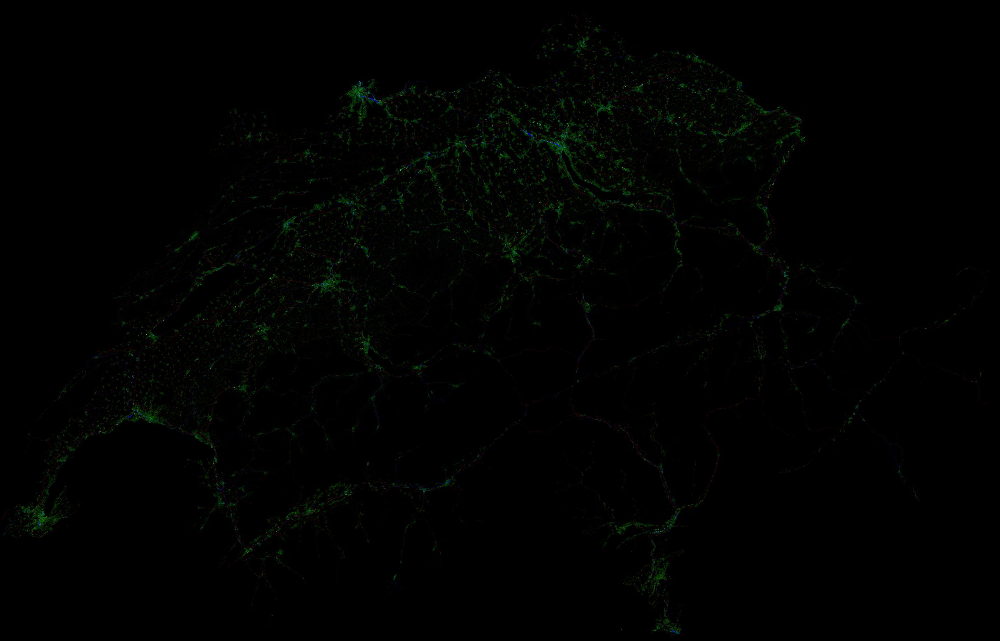

In [5]:
# Convert to PNG
image = Image.fromarray(array)
image

In [6]:
# Smooth image using gaussian blur
array = array.astype(np.float32)
array = scipy.ndimage.gaussian_filter(array, 1.5, mode="constant", axes=[0, 1])

In [7]:
# Consider quantiles for robust normalization
upper_bounds = np.quantile(array, 0.99, axis=[0, 1])
upper_bounds

array([ 9.3930217 , 36.33895325,  9.48392315])

In [8]:
# Normalize image
array = (array / upper_bounds * 255).clip(0, 255).astype(np.uint8)

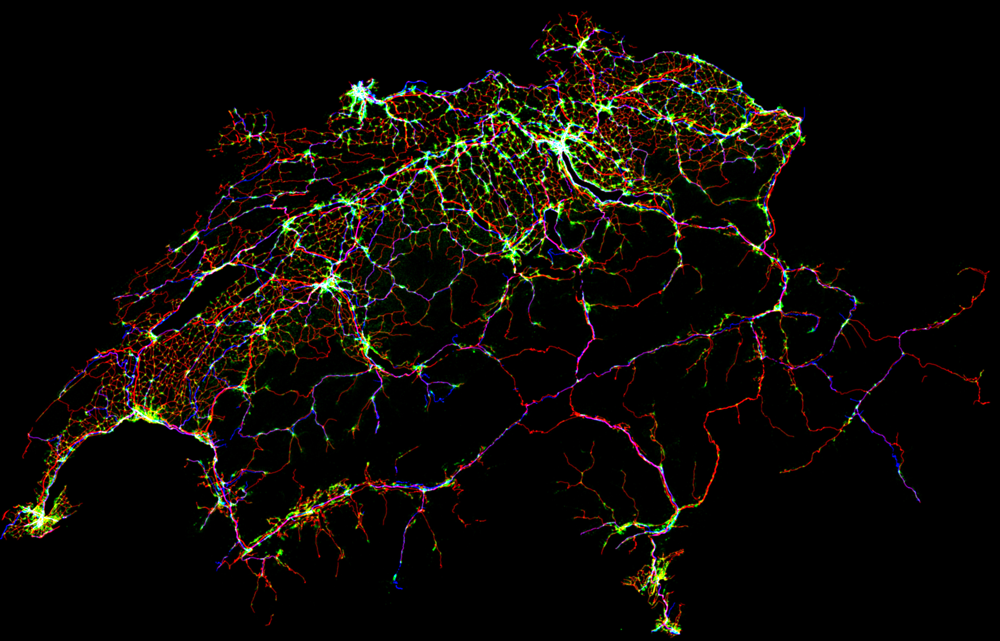

In [9]:
# Convert to image
image = Image.fromarray(array)
image